# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 26.09.2021

Мягкий дедлайн: 23:59MSK 11.10.2021

Жесткий дедлайн: 23:59MSK 14.10.2021

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [1]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=100)



Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from dateutil import parser
%matplotlib inline

sns.set(style="darkgrid")

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [4]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
DATA_FOLDER = "/content/drive/MyDrive/ml/study/HSE_ML_Homeworks/2021-fall/homeworks-practice/data_homework_02/taxi_drivers"
train = pd.read_csv(f'{DATA_FOLDER}/train.csv', index_col=0)
test = pd.read_csv(f'{DATA_FOLDER}/test.csv', index_col=0)
sample_submission = pd.read_csv(f'{DATA_FOLDER}/sample_submission.csv', index_col=0)

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1458644 entries, id2875421 to id1209952
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   vendor_id           1458644 non-null  int64  
 1   pickup_datetime     1458644 non-null  object 
 2   dropoff_datetime    1458644 non-null  object 
 3   passenger_count     1458644 non-null  int64  
 4   pickup_longitude    1458644 non-null  float64
 5   pickup_latitude     1458644 non-null  float64
 6   dropoff_longitude   1458644 non-null  float64
 7   dropoff_latitude    1458644 non-null  float64
 8   store_and_fwd_flag  1458644 non-null  object 
 9   trip_duration       1458644 non-null  int64  
dtypes: float64(4), int64(3), object(3)
memory usage: 122.4+ MB


In [7]:
test.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag
id,,,,,,,,
id3004672,1,2016-06-30 23:59:58,1,-73.988129,40.732029,-73.990173,40.756680,N
id3505355,1,2016-06-30 23:59:53,1,-73.964203,40.679993,-73.959808,40.655403,N
id1217141,1,2016-06-30 23:59:47,1,-73.997437,40.737583,-73.986160,40.729523,N
id2150126,2,2016-06-30 23:59:41,1,-73.956070,40.771900,-73.986427,40.730469,N
id1598245,1,2016-06-30 23:59:33,1,-73.970215,40.761475,-73.961510,40.755890,N


Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [8]:
del train["dropoff_datetime"]

In [9]:
train["pickup_datetime"] = train["pickup_datetime"].apply(lambda x: parser.parse(x))

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


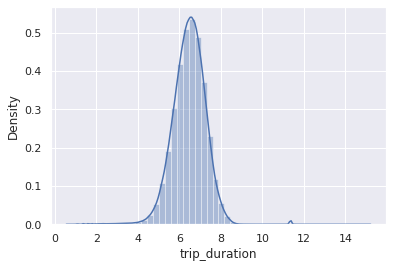

In [10]:
sns_plot = sns.distplot(np.log1p(train["trip_duration"]), kde=True)
fig = sns_plot.get_figure()

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: если мы подставим в формулу RMSLE $exp(\hat{a}(x_i)) - 1$ то получим формулу MSE

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

In [11]:
train["log_trip_duration"] = np.log1p(train["trip_duration"])
del train["trip_duration"]

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [12]:
pred_0 = train["log_trip_duration"].mean()

In [13]:
pred_0

6.466978409292814

## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [14]:
import datetime
train["month"] = train["pickup_datetime"].apply(lambda x: x.month)
train["weekday"] = train["pickup_datetime"].apply(lambda x: x.weekday())
train["date"] = train["pickup_datetime"].apply(lambda x: x.date())
train["day"] = train["pickup_datetime"].apply(lambda x: x.timetuple().tm_yday)
train["hours"] = train["pickup_datetime"].apply(lambda x: x.hour)
train["unnormal_date"] = (train["date"] == datetime.date(2016, 1, 23)).astype(int) + (train["date"] == datetime.date(2016, 1, 24)).astype(int)

In [15]:
train["unnormal_date"]

id
id2875421    0
id2377394    0
id3858529    0
id3504673    0
id2181028    0
            ..
id2376096    0
id1049543    0
id2304944    0
id2714485    0
id1209952    0
Name: unnormal_date, Length: 1458644, dtype: int64

In [16]:
print(train["unnormal_date"].unique())

[0 1]


In [17]:
train["day"].unique()

array([ 74, 164,  19,  97,  86,  30, 169, 142, 148,  70, 131, 136,  50,
       153, 137, 102, 105, 179, 157,  59,  92, 100, 177, 155,  45,  58,
       172, 165,  83, 138, 108,   9,  71,   5, 175, 112,  79,  43,   3,
        57, 139, 101, 128,  46, 104, 110,   2, 113,  60,   7, 134, 145,
        78,  34, 159,  76,  51,  84,  80, 103, 163,  56,  16,  28, 176,
       143,  91,  44,  20, 154,  35,  90, 120,  75, 158,  27,  10,  49,
        72,  26, 123,  21,  40, 111,  18, 162,  38,  62,  55, 168,  22,
       146, 150,  41,  69,  63, 149, 147,  32, 171,  77,  98,   1,   4,
       161,  93,  14, 106,  15,  31, 152, 166,  54, 182,  29,  89,  36,
        66, 115, 167, 117, 129,  82, 144,  68,  11, 178, 170,  85, 116,
        37,  65, 160,  33, 140, 135, 156,  48, 121,  25, 109, 114,  17,
        95,  39, 173,   6,  87,  99, 122, 125,  42, 124,  61, 118,  23,
        81, 141,  52, 174, 180, 127,  53, 119,  12,  47,  88, 132,  67,
        94,   8,  24, 181,  13, 126, 107, 130,  64,  73, 133, 15

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


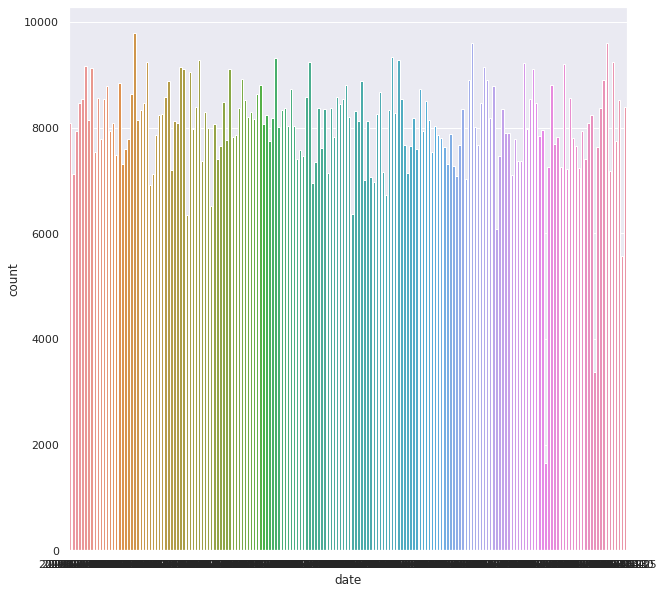

In [18]:
sns.set(rc={'figure.figsize':(10, 10)})
ax = sns.countplot(train["date"])

In [19]:
train["date"].value_counts()

2016-04-09    9796
2016-04-16    9602
2016-03-05    9597
2016-04-02    9325
2016-02-13    9309
              ... 
2016-01-03    6353
2016-01-25    6084
2016-05-30    5570
2016-01-24    3383
2016-01-23    1648
Name: date, Length: 182, dtype: int64

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


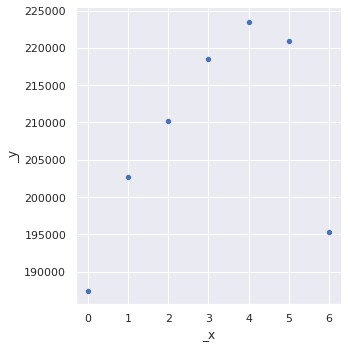

In [20]:
sns.set(rc={'figure.figsize':(10, 10)})
weekday_vc = train["weekday"].value_counts()
ax = sns.relplot(weekday_vc.index, weekday_vc.values)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


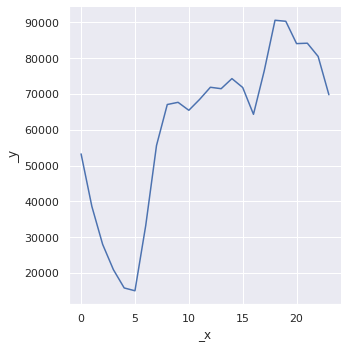

In [21]:
sns.set(rc={'figure.figsize':(10, 10)})
hours_vc = train["hours"].value_counts()
ax = sns.relplot(hours_vc.index, hours_vc.values, kind = 'line')

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

In [22]:
train.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,month,weekday,date,day,hours,unnormal_date
id,,,,,,,,,,,,,,,
id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493,3,0,2016-03-14,74,17,0
id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282,6,6,2016-06-12,164,0,0
id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527,1,1,2016-01-19,19,11,0
id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785,4,2,2016-04-06,97,19,0
id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642,3,5,2016-03-26,86,13,0


In [23]:
from tqdm import tqdm

In [24]:
month_hours_count = train.groupby(["month","hours"]).agg({'pickup_longitude':["count"]})

In [25]:
counts = month_hours_count[('pickup_longitude', 'count')].to_numpy()
month = []
hour = []
for el in month_hours_count.index.to_numpy():
    month.append(el[0])
    hour.append(el[1])

In [26]:
month_hours = pd.DataFrame({"month": month, "hour": hour, "counts": counts})

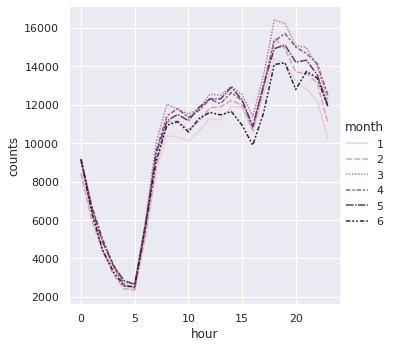

In [27]:
g = sns.relplot(data=month_hours,
    x="hour", y="counts",
    hue="month", style="month",
    kind="line"
)

In [28]:
weekday_hours_count = train.groupby(["weekday","hours"]).agg({'pickup_longitude':["count"]})
counts = weekday_hours_count[('pickup_longitude', 'count')].to_numpy()
weekday = []
hour = []
for el in weekday_hours_count.index.to_numpy():
    weekday.append(el[0])
    hour.append(el[1])
weekday_hours = pd.DataFrame({"weekday": weekday, "hour": hour, "counts": counts})

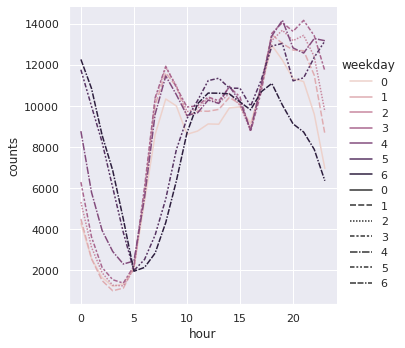

In [29]:
g = sns.relplot(data=weekday_hours,
    x="hour", y="counts",
    hue="weekday", style="weekday",
    kind="line"
)

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?
Можно сделать выводы ято выделяется воскресенье, люди меньше ездят на такси вечером в этот день.
**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3. По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [30]:
from sklearn.model_selection import train_test_split
X = train
y = train['log_trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


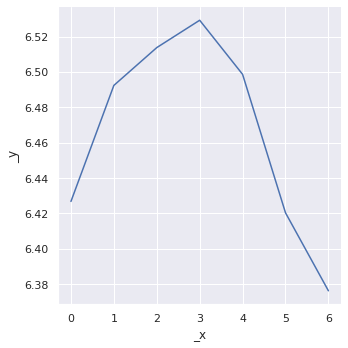

In [31]:
weekday_log = dict()
for i in (X_train['weekday'].unique()):
  weekday_log[i]=X_train[X_train['weekday']==i]['log_trip_duration'].mean()
weekday_log = pd.Series(weekday_log)
g = sns.relplot(weekday_log.index, weekday_log.values, kind='line')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


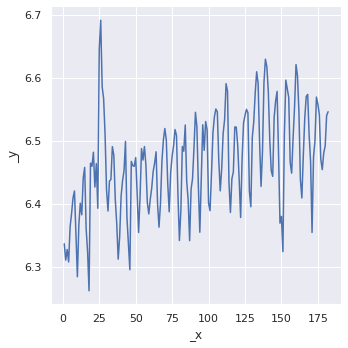

In [32]:
day_log = dict()
for i in (X_train['day'].unique()):
  day_log[i] = X_train[X_train['day']==i]['log_trip_duration'].mean()
day_log = pd.Series(day_log)
g = sns.relplot(day_log.index, day_log.values, kind='line')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


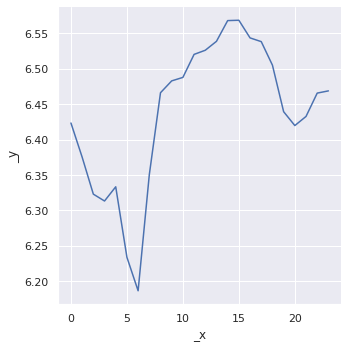

In [33]:
hours_log = dict()
for i in (X_train['hours'].unique()):
  hours_log[i]=X_train[X_train['hours']==i]['log_trip_duration'].mean()
hours_log = pd.Series(hours_log)
g = sns.relplot(hours_log.index, hours_log.values, kind='line')

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?
Похожи, но немного отличны. Поездок больше тогда, когда цена не слишком большая. в два аномальных дня таргет улетает в верх, наблюдаю восходящий тренд


In [34]:
del X_train["log_trip_duration"], X_test["log_trip_duration"]

Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков стоит рассматривать как категориальные, а какие - как численные? Почему?

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [35]:
del X_train["pickup_datetime"], X_test["pickup_datetime"]

In [36]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1021050 entries, id2209155 to id0357025
Data columns (total 13 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   vendor_id           1021050 non-null  int64  
 1   passenger_count     1021050 non-null  int64  
 2   pickup_longitude    1021050 non-null  float64
 3   pickup_latitude     1021050 non-null  float64
 4   dropoff_longitude   1021050 non-null  float64
 5   dropoff_latitude    1021050 non-null  float64
 6   store_and_fwd_flag  1021050 non-null  object 
 7   month               1021050 non-null  int64  
 8   weekday             1021050 non-null  int64  
 9   date                1021050 non-null  object 
 10  day                 1021050 non-null  int64  
 11  hours               1021050 non-null  int64  
 12  unnormal_date       1021050 non-null  int64  
dtypes: float64(4), int64(7), object(2)
memory usage: 109.1+ MB


In [37]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.compose import ColumnTransformer
cat_features = ["store_and_fwd_flag", "day", "month", "weekday", "hours", "vendor_id"]
numeric_features = ["passenger_count"]
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model_ridge = pipeline.fit(X_train, y_train)

In [38]:
y_train

id
id2209155    6.739337
id0586605    6.909753
id0467144    6.955593
id0989010    6.665684
id0580742    6.597146
               ...   
id1753868    7.156177
id2204747    6.726233
id3043606    7.159292
id1458584    5.966147
id0357025    7.359468
Name: log_trip_duration, Length: 1021050, dtype: float64

In [39]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1021050 entries, id2209155 to id0357025
Data columns (total 13 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   vendor_id           1021050 non-null  int64  
 1   passenger_count     1021050 non-null  int64  
 2   pickup_longitude    1021050 non-null  float64
 3   pickup_latitude     1021050 non-null  float64
 4   dropoff_longitude   1021050 non-null  float64
 5   dropoff_latitude    1021050 non-null  float64
 6   store_and_fwd_flag  1021050 non-null  object 
 7   month               1021050 non-null  int64  
 8   weekday             1021050 non-null  int64  
 9   date                1021050 non-null  object 
 10  day                 1021050 non-null  int64  
 11  hours               1021050 non-null  int64  
 12  unnormal_date       1021050 non-null  int64  
dtypes: float64(4), int64(7), object(2)
memory usage: 109.1+ MB


In [40]:
y_pred = model_ridge.predict(X_test)
from sklearn.metrics import mean_absolute_error
score = mean_absolute_error(y_test, y_pred)

In [41]:
print(np.exp(score)-1)

0.8190688182508516


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [42]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [43]:
show_circles_on_map(train.sample(10000), "pickup_latitude", "pickup_longitude", "blue")

**Вопрос**: Какие две точки выделяются на карте?

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [44]:
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # 
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

def dummy_manhattan_distance(lat1, lng1, lat2, lng2):
    a = haversine_array(lat1, lng1, lat1, lng2)
    b = haversine_array(lat1, lng1, lat2, lng1)
    return a + b

X_train.loc[:, 'haversine'] = dummy_manhattan_distance(X_train['pickup_latitude'].values, X_train['pickup_longitude'].values, X_train['dropoff_latitude'].values, X_train['dropoff_longitude'].values)
X_test.loc[:, 'haversine'] = dummy_manhattan_distance(X_test['pickup_latitude'].values, X_test['pickup_longitude'].values, X_test['dropoff_latitude'].values, X_test['dropoff_longitude'].values)

Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку:

In [45]:
X_train["log_haversine"] = np.log(X_train["haversine"]+1)
X_test["log_haversine"] = np.log(X_test["haversine"]+1)

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

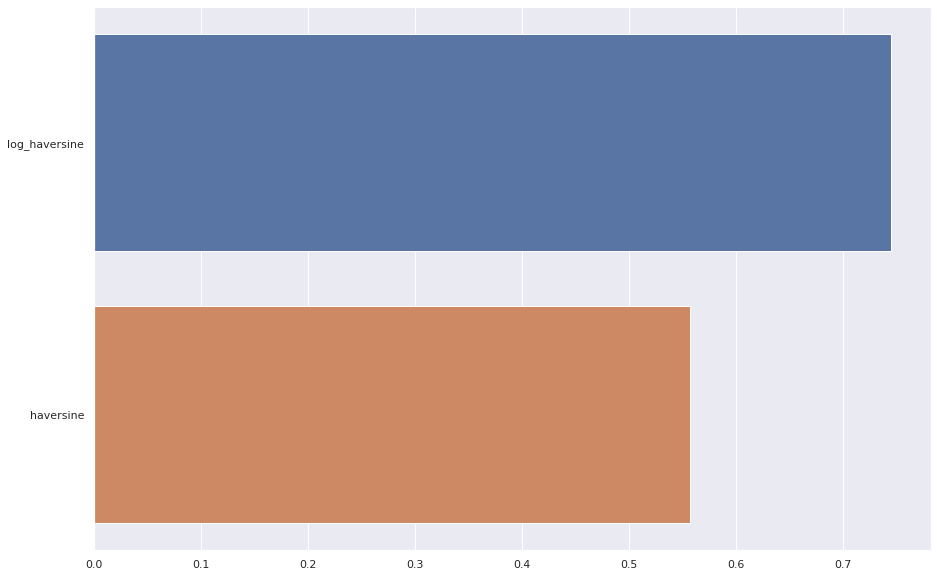

In [46]:
correlations = X_train[["haversine", "log_haversine"]].corrwith(y_train).sort_values(ascending=False)
plot = sns.barplot(y=correlations.index, x=correlations)
plot.figure.set_size_inches(15, 10)

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

In [47]:
X_train["trip_duration"] = np.exp(y_train)-1
X_train["v_average"] = X_train["haversine"]*3600/X_train["trip_duration"]

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


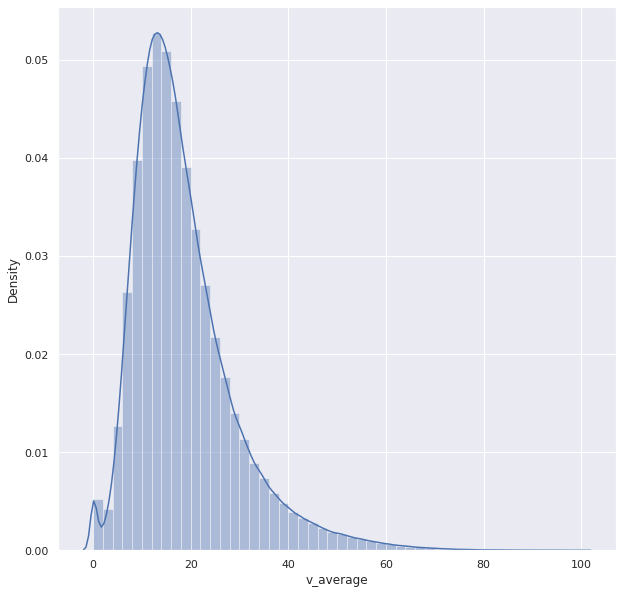

In [48]:
sns_plot = sns.distplot(X_train["v_average"][X_train["v_average"]<100], kde=True)
fig = sns_plot.get_figure()

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

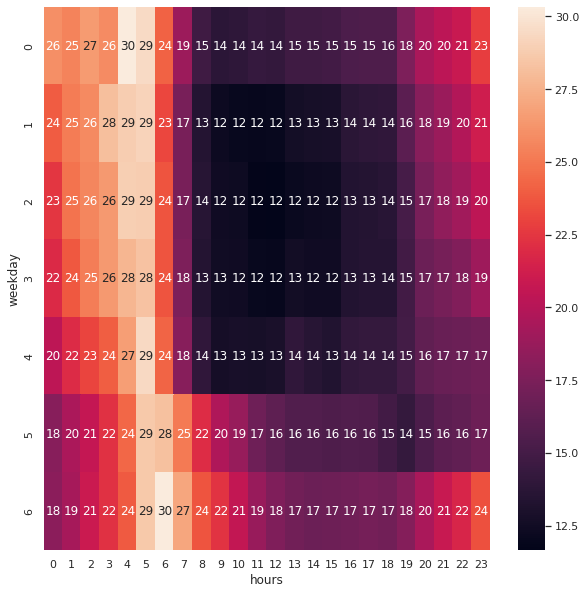

In [49]:
flights = X_train.pivot_table("v_average","weekday", "hours", aggfunc = 'median')
ax = sns.heatmap(flights, annot=True)

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

In [50]:
del X_train["v_average"]

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [51]:
X_train["period_probok"] = 0
X_train["period_probok"][(((X_train["hours"]<=12)  & (X_train["hours"]>=9))  & ((X_train["weekday"]>=1)  & (X_train["weekday"]<=4)))  | (((X_train["hours"]>=12)  & (X_train["hours"]<=15)) & ((X_train["weekday"]>=2)  & (X_train["weekday"]<=3)))] = 1 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [52]:
X_test["period_probok"] = 0
X_test["period_probok"][(((X_test["hours"]<=12)  & (X_test["hours"]>=9))  & ((X_test["weekday"]>=1)  & (X_test["weekday"]<=4)))  | (((X_test["hours"]>=12)  & (X_test["hours"]<=15)) & ((X_test["weekday"]>=2)  & (X_test["weekday"]<=3)))] = 1 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [53]:
X_train["period_pustota"] = (((X_train["hours"]<=5)  & (X_train["hours"]>=3))  & ((X_train["weekday"]>=0)  & X_train["weekday"]<=3))  | (((X_train["hours"]>=4)  & (X_train["hours"]<=6)) & ((X_train["weekday"]>=5) & (X_train["weekday"]<=6))) | (((X_train["hours"]<=5)  & (X_train["hours"]>=4))  &  (X_train["weekday"]==4))

In [54]:
X_test["period_pustota"] = (((X_test["hours"]<=5)  & (X_test["hours"]>=3))  & ((X_test["weekday"]>=0)  & X_test["weekday"]<=3))  | (((X_test["hours"]>=4)  & (X_test["hours"]<=6)) & ((X_test["weekday"]>=5) & (X_test["weekday"]<=6))) | (((X_test["hours"]<=5)  & (X_test["hours"]>=4))  &  (X_test["weekday"]==4))

**Задание 8 (0.25 балла)**. Как уже было замечено выше, на карте выделяются две точки вдали от Манхэттена. Для каждой из них добавьте в выборку два признака: началась ли поездка в ней и закончилась ли она в ней.

In [55]:
X_train["dropoff_latitude"][X_train["dropoff_latitude"]<30]

Series([], Name: dropoff_latitude, dtype: float64)

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


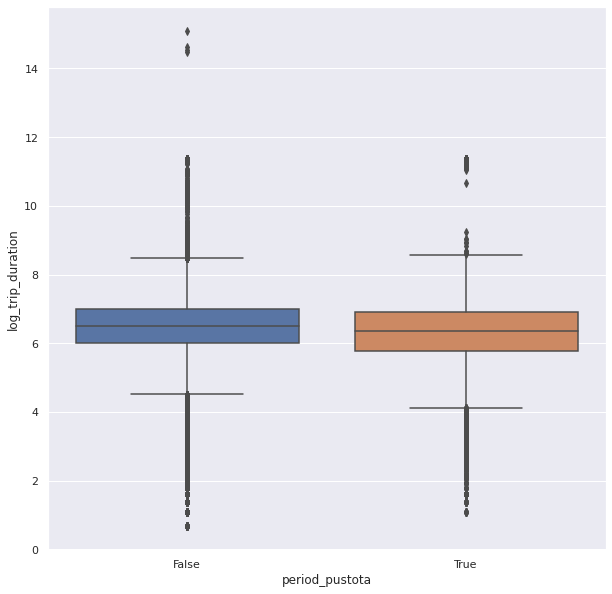

In [56]:
q = sns.boxplot(X_train["period_pustota"], y_train)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


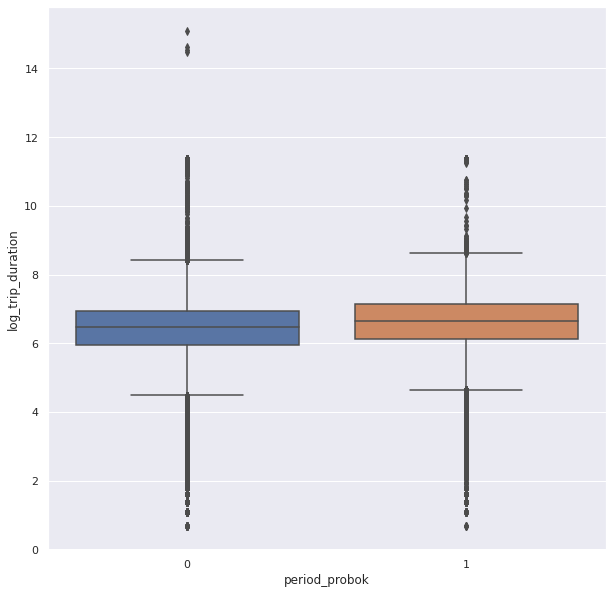

In [57]:
q = sns.boxplot(X_train["period_probok"], y_train)

In [58]:
X["pickup_latitude"][X["pickup_latitude"]>51.800]

id
id2306955    51.881084
Name: pickup_latitude, dtype: float64

In [59]:
df_lat_max = np.max(X["dropoff_latitude"].unique())

In [60]:
pp_lat_max = np.max(X["pickup_latitude"].unique())

In [61]:
pp_lon_max = np.max(X["pickup_longitude"].unique())

In [62]:
df_lon_max = np.max(X["dropoff_longitude"].unique())

In [63]:
df_lat_min = np.min(X["dropoff_latitude"].unique())

In [64]:
pp_lat_min = np.min(X["pickup_latitude"].unique())

In [65]:
pp_lon_min = np.min(X["pickup_longitude"].unique())

In [66]:
df_lon_min = np.min(X["dropoff_longitude"].unique())

In [67]:
X_train["dropoff_far_away"] = ((X_train["dropoff_longitude"] > df_lon_max-1) | (X_train["dropoff_latitude"] > df_lat_max - 1) | (X_train["dropoff_longitude"] < df_lon_min + 1) | (X_train["dropoff_latitude"] < df_lat_min + 1)).astype(int)

In [68]:
X_train["pickup_far_away"] = ((X_train["dropoff_longitude"] > pp_lon_max-1) | (X_train["dropoff_latitude"] > pp_lat_max - 1) | (X_train["dropoff_longitude"] < pp_lon_min + 1) | (X_train["dropoff_latitude"] < pp_lat_min + 1)).astype(int)

In [69]:
X_train["dropoff_far_away"].value_counts()

0    1021041
1          9
Name: dropoff_far_away, dtype: int64

In [70]:
X_test["dropoff_far_away"] = ((X_test["pickup_longitude"] > df_lon_max - 1) | (X_test["pickup_latitude"] > df_lat_max - 1) | (X_test["pickup_longitude"] <df_lon_min + 1) | (X_test["pickup_latitude"] < df_lat_min + 1)).astype(int)

In [71]:
X_test["pickup_far_away"] = ((X_test["pickup_longitude"] > pp_lon_max - 1) | (X_test["pickup_latitude"] > pp_lat_max - 1) | (X_test["pickup_longitude"] <pp_lon_min + 1) | (X_test["pickup_latitude"] < pp_lat_min + 1)).astype(int)

In [72]:
X_test["pickup_far_away"].value_counts()

0    437592
1         2
Name: pickup_far_away, dtype: int64

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [73]:
from sklearn.base import BaseEstimator, TransformerMixin

class MapGridTransformer(BaseEstimator, TransformerMixin):
     def __init__(self, cols_to_operate):
         self.columns = cols_to_operate


     def fit(self, X, y = None):
         pass

 
     def transform(self, X):
       pass

In [74]:
mh = np.array([
              [40.703314, -74.018608],
              [40.703314, -73.934241],
              [40.791438, -73.934241],
              [40.791438, -74.018608]
               ])

In [75]:
test1 = pd.DataFrame({'pickup_latitude': {824746: 40.7422103881836,
                      645821: 40.74176025390625,
                      691846: 40.75072479248047,
                      1147931: 40.77690124511719,
                      183569: 40.76437377929688},
                     'pickup_longitude': {824746: -73.99698638916014,
                      645821: -73.98992919921875,
                      691846: -73.97236633300781,
                      1147931: -73.98236083984375,
                      183569: -73.9737777709961},
                     'dropoff_latitude': {824746: 40.71065902709961,
                      645821: 40.783599853515625,
                      691846: 40.76838684082031,
                      1147931: 40.76092147827149,
                      183569: 40.761024475097656},
                     'dropoff_longitude': {824746: -73.9877395629883,
                      645821: -73.97727966308595,
                      691846: -73.86183166503906,
                      1147931: -73.97512817382812,
                      183569: -73.96695709228516}})

In [76]:
from scipy.spatial.distance import cdist

COL_NAMES = dict(
    pick_lat="pickup_latitude",
    pick_lon="pickup_longitude",
    drop_lat="dropoff_latitude",
    drop_lon="dropoff_longitude"
)


In [77]:
!pip install ipyleaflet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.3 MB 5.3 MB/s 


In [193]:
import pandas as pd
import numpy as np

from sklearn.base import BaseEstimator, TransformerMixin
from ipyleaflet import Map, Marker, basemaps, basemap_to_tiles, Polygon, CircleMarker, LayerGroup

class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, loc, col, row, col_names=COL_NAMES):
        self.location_mh = loc
        self.col = col
        self.row = row
        self.col_names = col_names
        self.pick_lat = col_names["pick_lat"]
        self.pick_lon = col_names["pick_lon"]
        self.drop_lat = col_names["drop_lat"]
        self.drop_lon = col_names["drop_lon"]
        self.lat_min, self.lat_max = loc[:, 0].min(), loc[:, 0].max()
        self.lon_min, self.lon_max = loc[:, 1].min(), loc[:, 1].max()

    def create_box_(self, loc):
        polygon_loc = [
                    [(loc[0] - self.walls[0] / 2), loc[1] - self.walls[1] / 2],
                    [loc[0] + self.walls[0] / 2, loc[1] - self.walls[1] / 2],
                    [loc[0] + self.walls[0] / 2, loc[1] + self.walls[1] / 2],
                    [loc[0] - self.walls[0] / 2, loc[1] + self.walls[1] / 2]
                  ]
        return polygon_loc

    def fit(self):
        self.walls = [(self.location_mh[:, 0].max() - self.location_mh[:, 0].min()) / self.col, \
              (self.location_mh[:, 1].max() - self.location_mh[:, 1].min()) / self.row]

        self.circles_loc = np.array([(((self.location_mh[:, 0].min() + i * (self.walls[0] / 2))), \
                               (self.location_mh[:, 1].min() + j * (self.walls[1] / 2)) ) \
                            for i in range(1, (self.col) * 2, 2) for j in range(1, (self.row) * 2, 2)])

        return self.walls, self.circles_loc
      

    def transform(self, X):
        self.X = X
        pickup_idx = cdist(X.loc[:, [self.pick_lat, self.pick_lon]],
                           self.circles_loc).argmin(axis=1)
        dropoff_idx = cdist(X.loc[:, [self.drop_lat, self.drop_lon]],
                            self.circles_loc).argmin(axis=1)
        qry = f"@self.lat_min <= {self.pick_lat} <= @self.lat_max \
               and @self.lon_min <= {self.pick_lon} <= @self.lon_max"
        pickup_valid = X.eval(qry).to_numpy()
        pickup_idx[~pickup_valid] = 0
        qry = f"@self.lat_min <= {self.drop_lat} <= @self.lat_max \
               and @self.lon_min <= {self.drop_lon} <= @self.lon_max"
        dropoff_valid = X.eval(qry).to_numpy()
        dropoff_idx[~dropoff_valid] = 0
        return pickup_idx, dropoff_idx

    def fit_transform(self, X):
      _, circles_loc = self.fit()
      self.transform(X)
        



mh = np.array([
              [40.703314, -74.018608],
              [40.703314, -73.934241],
              [40.791438, -73.934241],
              [40.791438, -74.018608]
               ])

a = MapGridTransformer(mh, 9, 8)
a.fit()

([0.009791555555555616, 0.010545875000000038],
 array([[ 40.70820978, -74.01333506],
        [ 40.70820978, -74.00278919],
        [ 40.70820978, -73.99224331],
        [ 40.70820978, -73.98169744],
        [ 40.70820978, -73.97115156],
        [ 40.70820978, -73.96060569],
        [ 40.70820978, -73.95005981],
        [ 40.70820978, -73.93951394],
        [ 40.71800133, -74.01333506],
        [ 40.71800133, -74.00278919],
        [ 40.71800133, -73.99224331],
        [ 40.71800133, -73.98169744],
        [ 40.71800133, -73.97115156],
        [ 40.71800133, -73.96060569],
        [ 40.71800133, -73.95005981],
        [ 40.71800133, -73.93951394],
        [ 40.72779289, -74.01333506],
        [ 40.72779289, -74.00278919],
        [ 40.72779289, -73.99224331],
        [ 40.72779289, -73.98169744],
        [ 40.72779289, -73.97115156],
        [ 40.72779289, -73.96060569],
        [ 40.72779289, -73.95005981],
        [ 40.72779289, -73.93951394],
        [ 40.73758444, -74.01333506],
   

In [194]:
x, y = a.transform(X_train[["pickup_latitude","pickup_longitude","dropoff_latitude","dropoff_longitude"]])

In [195]:
X_train["pickup_grid"] = x

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [196]:
X_train["dropoff_grid"] = y

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [200]:
x, y = a.transform(X_test[["pickup_latitude","pickup_longitude","dropoff_latitude","dropoff_longitude"]])

In [201]:
X_test["pickup_grid"] = x

In [202]:
X_test["dropoff_grid"] = y

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [85]:
del X_train["trip_duration"]

In [86]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.compose import ColumnTransformer
cat_features = ["store_and_fwd_flag", "day", "month", "weekday", "hours", "vendor_id", "pickup_grid", "dropoff_grid", "pickup_far_away", "dropoff_far_away", "period_pustota", "period_probok", "unnormal_date"]
numeric_features = ["passenger_count", "haversine", "log_haversine"]
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model_ridge = pipeline.fit(X_train, y_train)

In [87]:
y_pred = model_ridge.predict(X_test)
from sklearn.metrics import mean_absolute_error
score = mean_absolute_error(y_test, y_pred)

In [88]:
print(np.exp(score)-1)

0.3865793665258934


## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [89]:
X_train["vendor_id"].value_counts()

2    546566
1    474484
Name: vendor_id, dtype: int64

In [90]:
X_train["passenger_count"].value_counts()

1    723614
2    147429
5     54532
3     41919
6     33707
4     19804
0        41
7         2
8         1
9         1
Name: passenger_count, dtype: int64

In [91]:
X_train["store_and_fwd_flag"].value_counts()

N    1015403
Y       5647
Name: store_and_fwd_flag, dtype: int64

Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


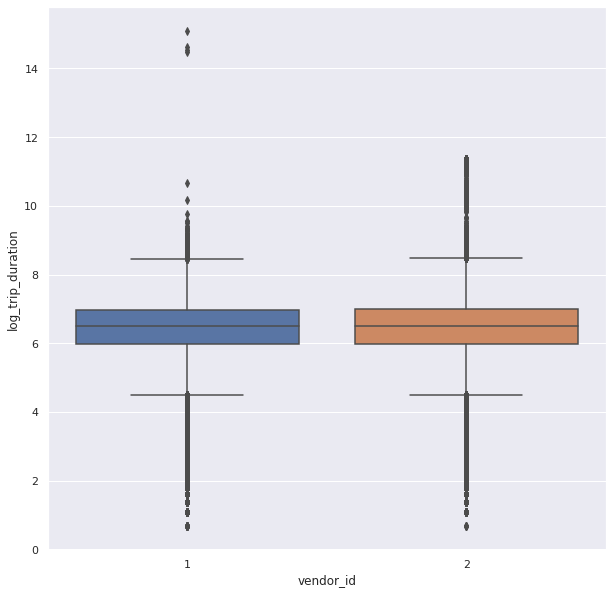

In [92]:
q = sns.boxplot(X_train["vendor_id"], y_train)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


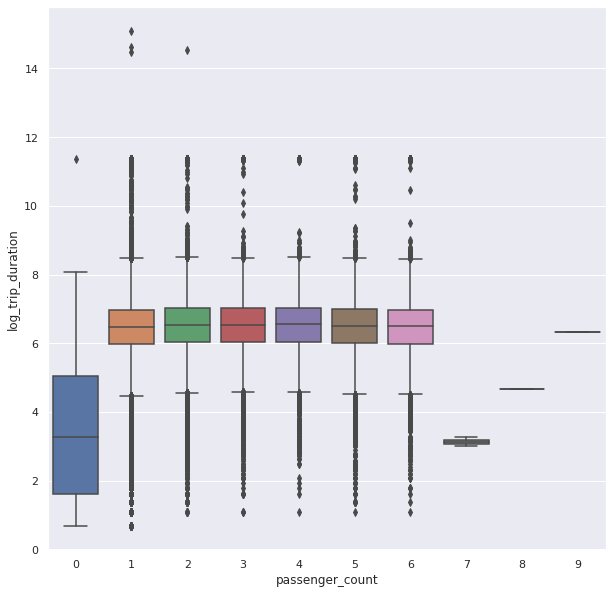

In [93]:
q = sns.boxplot(X_train["passenger_count"], y_train)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


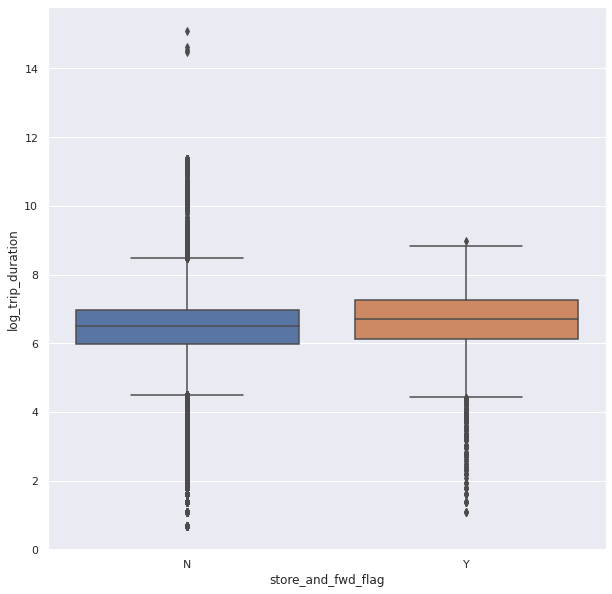

In [94]:
q = sns.boxplot(X_train["store_and_fwd_flag"], y_train)

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [95]:
X_train["vendor_id"] -= 1
X_test["vendor_id"] -= 1

In [96]:
X_train["store_and_fwd_flag"] = X_train["store_and_fwd_flag"] == "N"

**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [97]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.compose import ColumnTransformer
cat_features = ["passenger_count","store_and_fwd_flag", "day", "month", "weekday", "hours", "vendor_id", "pickup_grid", "dropoff_grid", "pickup_far_away", "dropoff_far_away", "period_pustota", "period_probok", "unnormal_date", "vendor_id"]
numeric_features = ["haversine", "log_haversine"]
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model_ridge = pipeline.fit(X_train, y_train)

In [98]:
y_pred = model_ridge.predict(X_test)
from sklearn.metrics import mean_absolute_error
score = mean_absolute_error(y_test, y_pred)

In [99]:
print(np.exp(score)-1)

0.38653622319563463


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

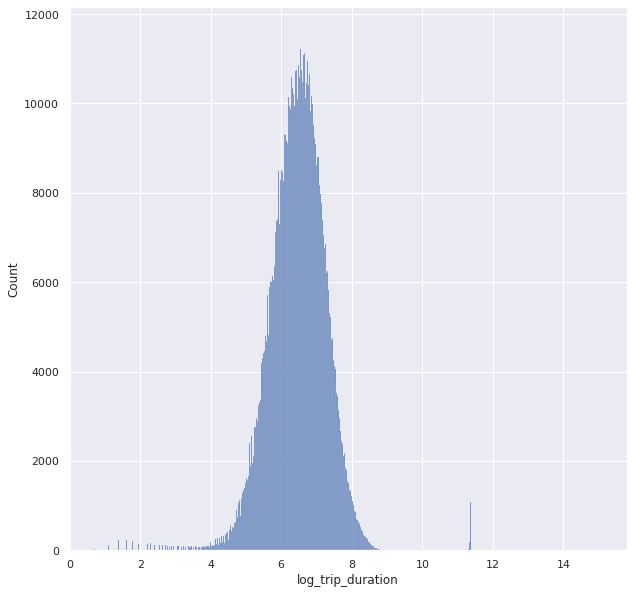

In [100]:
q = sns.histplot(y_train)
X_train["ltd"] = y_train
y_train = y_train[(y_train > 1.2)]
X_train = X_train[X_train["ltd"] > 1.2]
del X_train["ltd"]

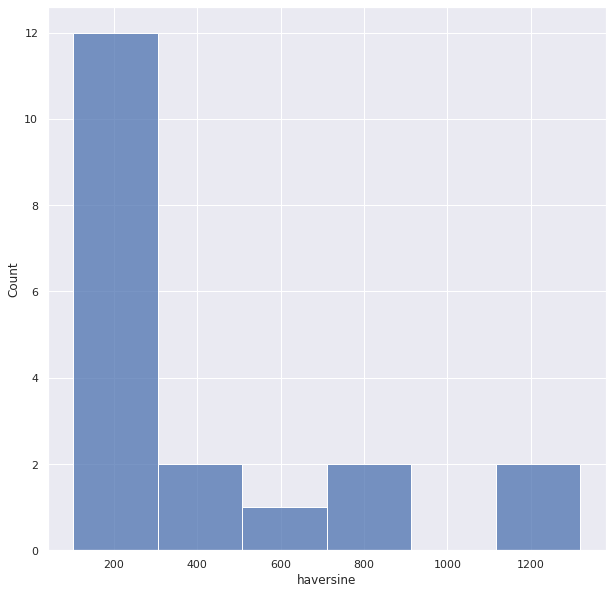

In [101]:
q = sns.histplot(X_train[X_train["haversine"]>100]["haversine"])
X_train["ltd"] = y_train
X_train = X_train[X_train["haversine"]<300]
y_train = X_train["ltd"]
del X_train["ltd"]

In [102]:
X_train

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,month,weekday,date,...,hours,unnormal_date,haversine,log_haversine,period_probok,period_pustota,dropoff_far_away,pickup_far_away,pickup_grid,dropoff_grid
id,,,,,,,,,,,,,,,,,,,,,
id2209155,1,2,-73.979813,40.752529,-73.982681,40.763680,True,5,1,2016-05-03,...,9,0,1.481502,0.908864,1,False,0,0,43,51
id0586605,0,1,-73.977623,40.746296,-73.968414,40.788933,True,1,4,2016-01-01,...,16,0,5.516762,1.874378,0,False,0,0,35,68
id0467144,0,1,-73.950699,40.779404,-73.863129,40.768608,True,4,6,2016-04-24,...,13,0,8.573836,2.259034,0,False,0,0,62,-1
id0989010,1,1,-73.984558,40.721802,-73.976753,40.752213,True,1,6,2016-01-10,...,17,0,4.039264,1.617260,0,False,0,0,11,35
id0580742,0,1,-73.967720,40.768742,-73.977173,40.789875,True,2,3,2016-02-25,...,17,0,3.145986,1.422141,0,False,0,0,52,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
id1753868,1,2,-73.955032,40.777328,-74.006203,40.749424,True,3,4,2016-03-25,...,7,0,7.411524,2.129603,0,False,0,0,62,33
id2204747,0,1,-73.973618,40.763920,-73.983849,40.749874,True,2,1,2016-02-16,...,18,0,2.423466,1.230653,0,False,0,0,52,35
id3043606,1,1,-74.006195,40.734283,-73.949608,40.785282,True,1,1,2016-01-26,...,19,0,10.438681,2.437001,0,False,0,0,25,70


In [103]:
y_pred_train = model_ridge.predict(X_train)
from sklearn.metrics import mean_absolute_error
score = mean_absolute_error(y_train, y_pred_train)

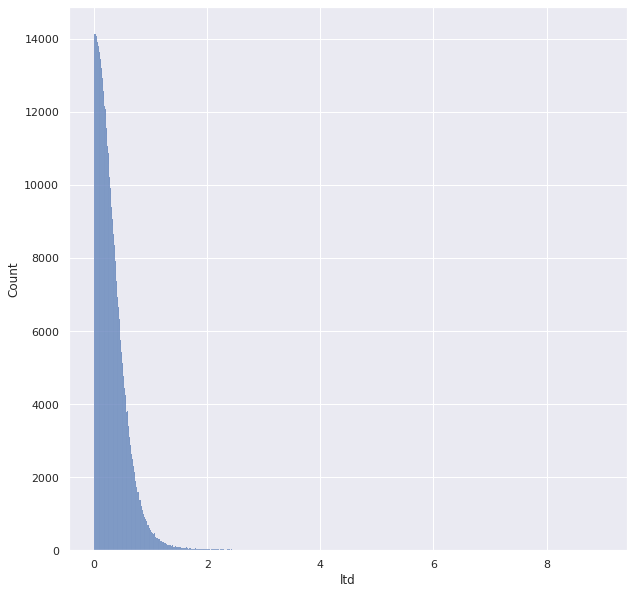

In [104]:
q = sns.histplot(abs(y_pred_train-y_train))
X_train["ltd"] = y_train
y_train = y_train[abs(y_pred_train - y_train) < 2]
X_train = X_train[abs(y_pred_train - X_train["ltd"]) < 2]
del X_train["ltd"]

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуйте объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

In [105]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1015505 entries, id2209155 to id0357025
Data columns (total 21 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   vendor_id           1015505 non-null  int64  
 1   passenger_count     1015505 non-null  int64  
 2   pickup_longitude    1015505 non-null  float64
 3   pickup_latitude     1015505 non-null  float64
 4   dropoff_longitude   1015505 non-null  float64
 5   dropoff_latitude    1015505 non-null  float64
 6   store_and_fwd_flag  1015505 non-null  bool   
 7   month               1015505 non-null  int64  
 8   weekday             1015505 non-null  int64  
 9   date                1015505 non-null  object 
 10  day                 1015505 non-null  int64  
 11  hours               1015505 non-null  int64  
 12  unnormal_date       1015505 non-null  int64  
 13  haversine           1015505 non-null  float64
 14  log_haversine       1015505 non-null  float64
 15  period_pro

In [106]:
X_train["far_away"] = ((X_train["dropoff_far_away"]>0)|(X_train["pickup_far_away"]>0)).astype(int)
X_test["far_away"] = ((X_test["dropoff_far_away"]>0)|(X_test["pickup_far_away"]>0)).astype(int)
del X_train["pickup_far_away"], X_train["dropoff_far_away"]
del X_test["pickup_far_away"], X_test["dropoff_far_away"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [107]:
cat_features = ["passenger_count","store_and_fwd_flag", "day", "month", "weekday", "hours", "vendor_id", "pickup_grid", "dropoff_grid", "far_away", "period_pustota", "period_probok", "unnormal_date", "vendor_id"]

In [108]:
k = 0
for i in cat_features:
  k += len(X_train[i].unique())-1 
print(k, len(cat_features))

372 14


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [109]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.compose import ColumnTransformer
cat_features = ["passenger_count","store_and_fwd_flag", "day", "month", "weekday", "hours", "vendor_id", "pickup_grid", "dropoff_grid", "far_away", "period_pustota", "period_probok", "unnormal_date", "vendor_id"]
numeric_features = ["haversine", "log_haversine"]
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline_r = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])
pipeline_l = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

model_ridge_r = pipeline_r.fit(X_train, y_train)
model_ridge_l = pipeline_l.fit(X_train, y_train)

In [110]:
y_pred_r = model_ridge_r.predict(X_test)
y_pred_l = model_ridge_l.predict(X_test)
from sklearn.metrics import mean_absolute_error
score_r = mean_absolute_error(y_test, y_pred_r)
score_l = mean_absolute_error(y_test, y_pred_l)

In [111]:
print(np.exp(score_r)-1)

0.3835924425820696


In [112]:
print(np.exp(score_l)-1)

0.8317836917352623


Разбейте обучающую выборку на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [113]:
from sklearn.model_selection import train_test_split
X_train_2, X_val, y_train_2, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

Best alpha = 13.5388


Text(0, 0.5, 'CV score')

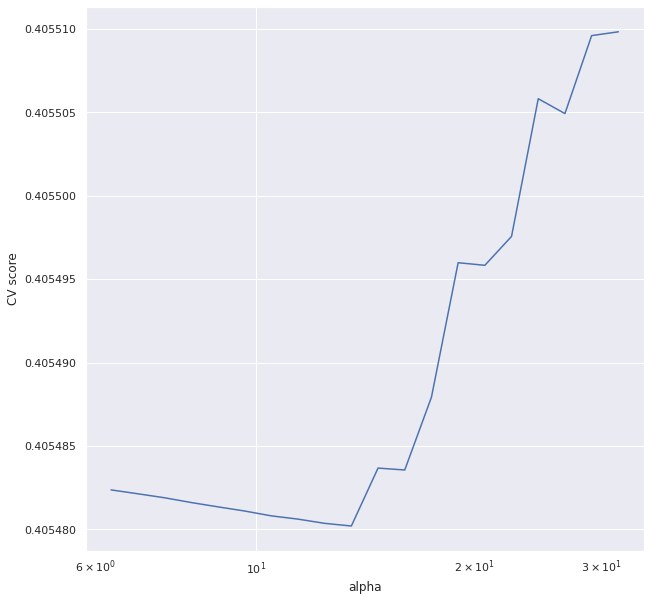

In [114]:
from sklearn.model_selection import GridSearchCV

alphas = np.logspace(0.8, 1.5, 20)
searcher_r = GridSearchCV(Ridge(), [{"alpha": alphas}], scoring="neg_root_mean_squared_error", cv=10)
X = column_transformer.fit_transform(X_val)
searcher_r.fit(X, y_val)

best_alpha = searcher_r.best_params_["alpha"]
print("Best alpha = %.4f" % best_alpha)

plt.plot(alphas, -searcher_r.cv_results_["mean_test_score"])
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score")

Best alpha = 0.0010


Text(0, 0.5, 'CV score')

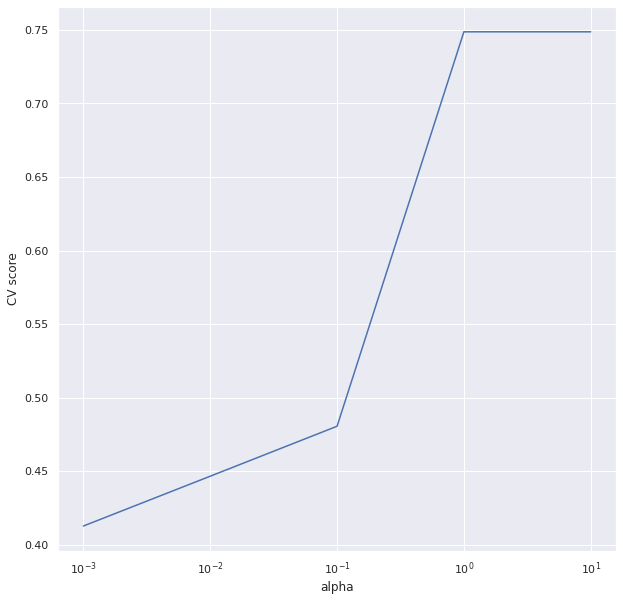

In [115]:
from sklearn.model_selection import GridSearchCV
X = column_transformer.fit_transform(X_val)
alphas = np.logspace(-3, 1, 5)
searcher_l = GridSearchCV(Lasso(), [{"alpha": alphas}], scoring="neg_root_mean_squared_error", cv=10)
searcher_l.fit(X, y_val)

best_alpha = searcher_l.best_params_["alpha"]
print("Best alpha = %.4f" % best_alpha)

plt.plot(alphas, -searcher_l.cv_results_["mean_test_score"])
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score")

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

In [116]:
x = np.array([0, 0, 0, 1])
z = x==0

In [117]:
num_null_coef = []

In [118]:
for a in alphas:
  model_l = Lasso(alpha = a)
  model_l.fit(X, y_val)
  k = 0
  for coef in model_l.coef_:
    if coef==0:
      k+=1
  num_null_coef.append(k)

Text(0, 0.5, 'num of null coef')

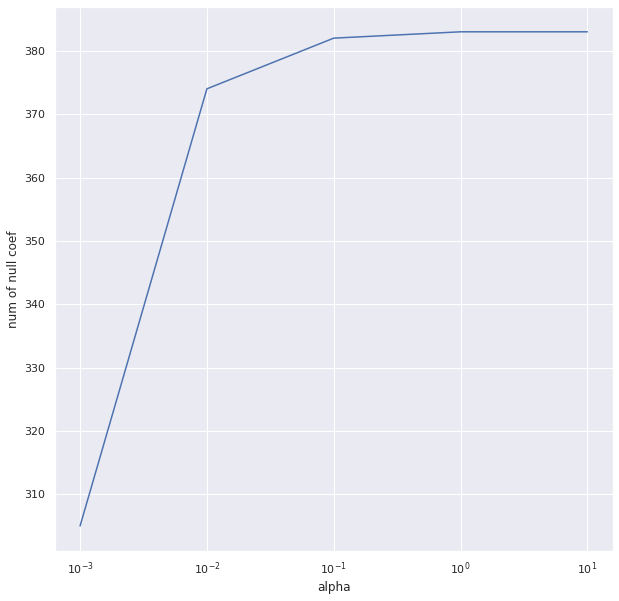

In [119]:
plt.plot(alphas, num_null_coef)
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("num of null coef")

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

In [203]:
def cell(x):
  x = sorted(list(map(int, x.split(" "))),reverse = True)

  return "".join(map(str, x))

In [204]:
X_train["grid_way"] = X_train["pickup_grid"].astype(str) + " " + X_train["dropoff_grid"].astype(str)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [205]:
X_train["grid_way"] = X_train["grid_way"].apply(lambda x: cell(x))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [206]:
v = X_train["grid_way"].value_counts()

In [207]:
print(v)

00      56248
430     12732
440     11170
510     10998
4334    10862
        ...  
3127        1
2012        1
5635        1
6864        1
4842        1
Name: grid_way, Length: 1933, dtype: int64


In [208]:
v = X_train["grid_way"].value_counts().index
v = v[:100]
X_train["grid_way"] = X_train["grid_way"].apply(lambda x: x if x in v else 0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [209]:
X_test["grid_way"] = X_test["pickup_grid"].astype(str) + " " + X_test["dropoff_grid"].astype(str)

In [210]:
X_test["grid_way"] = X_test["grid_way"].apply(lambda x: cell(x))

In [211]:
v = X_test["grid_way"].value_counts().index
v = v[:100]
X_test["grid_way"] = X_test["grid_way"].apply(lambda x: x if x in v else 0)

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [212]:
y_train

id
id2209155    6.739337
id0586605    6.909753
id0467144    6.955593
id0989010    6.665684
id0580742    6.597146
               ...   
id1753868    7.156177
id2204747    6.726233
id3043606    7.159292
id1458584    5.966147
id0357025    7.359468
Name: ltd, Length: 1015505, dtype: float64

In [213]:
X_train["grid_way"] = X_train["grid_way"].astype(int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [214]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.compose import ColumnTransformer

cat_features = ["passenger_count","store_and_fwd_flag", "day", 
                "month", "weekday", "hours", "vendor_id", "pickup_grid",
                "dropoff_grid", "far_away", "period_pustota",
                "period_probok", "unnormal_date", "vendor_id", "grid_way"]
numeric_features = ["log_haversine", "haversine"]

column_transformer = ColumnTransformer([
                                        ("ohe", OneHotEncoder(handle_unknown="ignore"), cat_features),
                                        ("scaling", StandardScaler(), numeric_features)])
pipeline = Pipeline(steps=[("ohe_and_scaling", column_transformer),
                           ("regression", Ridge(alpha = 10))])

model = pipeline.fit(X_train, y_train)
y_preds = model.predict(X_test)
from sklearn.metrics import mean_absolute_error
score = mean_absolute_error(y_test, y_preds)

In [215]:
print(score)

0.32486896454503256


Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.